In [1]:
import scanpy as sc
import os
import anndata as ad
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
sc.settings.verbosity=0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.n_jobs=4
sc.settings.set_figure_params(dpi=300, facecolor="white", frameon=False, figsize=(8,8))
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
%matplotlib inline




In [2]:
sc.settings.figdir = "fig6"


# Load v2

In [3]:
adata_lesional=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/final_fb_adatas/adata_all_6150_umap5.h5ad.paga2.annotated9.lesionalonly')



In [4]:
# Define the path to your pickle file
pickle_file_path = '/nfs/team298/ls34/fb_dict_lesional.pkl'

# Open the pickle file and load the dictionary
with open(pickle_file_path, 'rb') as file:
    LESIONAL_GENES_VSHORT5 = pickle.load(file)
    
    

In [5]:
# Define the path to your pickle file
pickle_file_path = '/nfs/team298/ls34/fb_dict.pkl'

# Open the pickle file and load the dictionary
with open(pickle_file_path, 'rb') as file:
    reynolds_short_final = pickle.load(file)

# CROSS-TISSUE

In [6]:
# CROSS_TISSUE_MARKERS = {"SPARC+COL3A1+": ["SPARC", "COL3A1", "CTHRC1", "COL1A1", "KIF26B", "POSTN", "ADAM12", "MMP13", "ITM2A"  ],
#                     "CXCL10+CCL19+": ["CCL19", "CXCL10", "CXCL9", "CD74", "HLA-DRA", "RBP5", "CCL21", "IRF8"]
#                        }

CROSS_TISSUE_MARKERS = { "CCL19+ Colitis\n(Buechler et al.)" : ["CCL19", "GREM1", "TNFSF13B"],
          "ADAMDEC1+ Colitis\n(Buechler et al.)": ["ADAMDEC1", "CXCL14"],
                                            "CXCL10+CCL19+\n(Korunsky et al.)": ["CCL19", "CXCL10", "CXCL9", "CD74", "HLA-DRA", "RBP5", "CCL21", "IRF8"],
                    "CD74+\n(Gao et al.)": ['CXCL12', 'CD74', 'HLA-DRB1', 'HLA-DRA'],

                        
          "LRRC15+ Myofibroblast\n(Buechler et al.)": ["LRRC15", "COL11A1", "CTHRC1"],
          "COL3A1+ Myofibroblast\n(Buechler et al.)": ["COL3A1", "POSTN", "CTHRC1"],
        "SPARC+COL3A1+\n(Korunsky et al.)": ["SPARC", "COL3A1", "CTHRC1", "COL1A1", "KIF26B", "POSTN", "ADAM12", "MMP13", "ITM2A"  ],
       "c4-LRRC15\n(Gao et al.)": ["MMP11", "COL10A1", "POSTN", "LRRC15", "CTHRC1", "PRSS23", "ASPN", "COL11A1", "COL10A1", "CTNNB1", "PTK7", "FNDC1"],
    "c16-SFRP2\n(Gao et al.)": ["CCDC80", "COL14A1", "SFRP2", "DPT", "IGF1", "SFRP4", "CLU", "COMP", "SFRP1", "IGF2"] ,
       "c19-MMP1\n(Gao et al.)": ["MMP1", "COL7A1", "WNT5A", "ISG15", "IL7R", "B2M", "SOD2", "ISG15", "ICAM1", "CXCL1", "CD74", "ICAM1", "TWIST1", "CCL11"],
                      "NPNT+ Alveolar\n(Buechler et al.)": ["NPNT", "CES1", "ADH1B", "FGFR4",# 'COL14A1', 'PIEZO2', 'CD81'
                                                           ],

          
          
                       }
    
sc.pl.matrixplot(
    adata_lesional,
    CROSS_TISSUE_MARKERS,cmap="Reds",
    groupby="test13",#vmax=1.2,
    standard_scale="var", colorbar_title='Mean expression\n(variance scaled)',
    dendrogram=False,
     save="fig6a_crosstissuecomparison.pdf"
)         
 

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


# f6 across diseases

In [7]:
xtick_order_orig=["Dupuytren's",
 'Keloid scar',
 'Morphoea (pansclerotic)',
 'Systemic sclerosis',
 'Non-keloid scar',
 'Basal cell carcinoma',
 'Squamous cell carcinoma',
 'Acral melanoma',
 'Cutaneous melanoma',
 'Sarcoidosis',
 'Granuloma annulare',
 'Hidradenitis supparativa',
 'Lupus (DLE)',
 'Acne',
 'Psoriasis',
 'Eczema',
 'Prurigo nodularis',
 'Drug reaction: lichenoid',
 'Drug reaction: DRESS',
 'Lupus (SCLE)',
 'Alopecia areata',
  'Erythema migrans',
 'Neurofibroma']
xtick_order_orig



["Dupuytren's",
 'Keloid scar',
 'Morphoea (pansclerotic)',
 'Systemic sclerosis',
 'Non-keloid scar',
 'Basal cell carcinoma',
 'Squamous cell carcinoma',
 'Acral melanoma',
 'Cutaneous melanoma',
 'Sarcoidosis',
 'Granuloma annulare',
 'Hidradenitis supparativa',
 'Lupus (DLE)',
 'Acne',
 'Psoriasis',
 'Eczema',
 'Prurigo nodularis',
 'Drug reaction: lichenoid',
 'Drug reaction: DRESS',
 'Lupus (SCLE)',
 'Alopecia areata',
 'Erythema migrans',
 'Neurofibroma']

(6157, 36601)


/tmp/ipykernel_17279/3344018603.py:97: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(  lambda x: f"{x} (n={filtered_counts[x]})")
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and sil

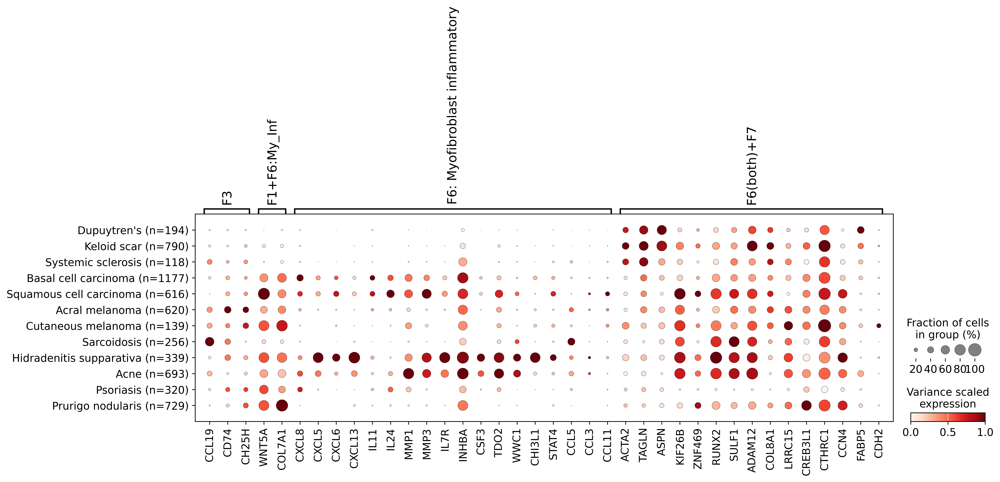

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_matrixplot.py:143: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


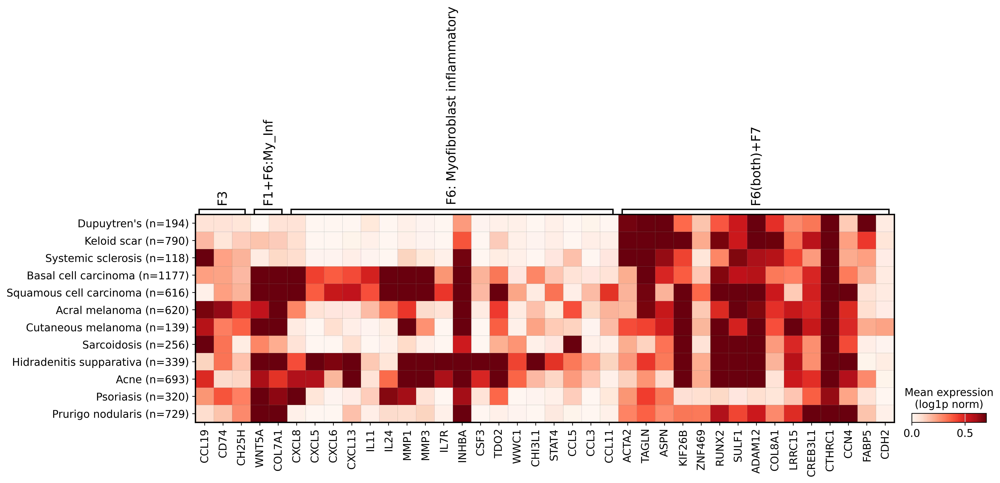

In [10]:
LESIONAL_GENES_VSHORT5 = {'F3': ['CCL19', 'CD74', 'CH25H'],
#  'F1': ['COL18A1',
#   'COL23A1',
#   'COL13A1',
#   'COMP',
#   'NKD2',
#   'CRABP1',
#   'TNFRSF21',
#   'CXCL1'],
 'F1+F6:My_Inf': ['WNT5A', 'COL7A1'],
 'F6: Myofibroblast inflammatory': ['CXCL8',
  'CXCL5',
  'CXCL6',
  'CXCL13',
  'IL11',
  'IL24',
  'MMP1',
  'MMP3',
  'IL7R',
  'INHBA',
  'CSF3',
  'TDO2',
  'WWC1',
  'CHI3L1',
  'STAT4',
  'CCL5',
  'CCL3',
  'CCL11'],
#'F6 (both)': ['WNT2', 'COL10A1', 'LAMP5'],
                          'F6(both)+F7': ['ACTA2',
  'TAGLN',
  'ASPN',
  'KIF26B',
  'ZNF469',
  'RUNX2',
  'SULF1',
  'ADAM12',
  'COL8A1',
  'LRRC15',
  'CREB3L1',
  'CTHRC1',
  'CCN4',
  'FABP5',
  'CDH2'],
#  'F6: MyoFb': ['NRG1', 'OGN'],
#  'F6(both)+F7': ['ACTA2',
#   'TAGLN',
#   'ASPN',
#   'KIF26B',
#   'ZNF469',
#   'RUNX2',
#   'SULF1',
#   'ADAM12',
#   'COL8A1',
#   'LRRC15',
#   'CREB3L1',
#   'CTHRC1',
#   'CCN4',
#   'FABP5',
#   'CDH2'],
#  'F6: MyoFb + F7': ['C1QTNF3', 'CADM1', 'LRRC17', 'PIEZO2', 'SFRP4', 'KCNMA1'],
#  'F7': ['ACAN'],
#  'F_Fascia': ['PRG4',
#   'CRTAC1',
#   'THBS4',
#   'SCX',
#   'FGF18',
#   'ITGA10',
#   'CCN3',
#   'CHAD',
#   'PDLIM3',
#   'EVI2A']
                         }
 
    
  
 
    
for x in [ 'F6: Inflammatory myofibroblast']: # 'F1: Superficial regenerative',  'F3: CCL19+',  'F6: Myofibroblast', 
    adata_i = adata_lesional[adata_lesional.obs["test13"] == x]
    print(adata_i.shape)
    # Calculate the counts of cells for each category within adata_i
    counts = pd.Series(adata_i.obs['Patient_status2']).value_counts()

    # Filter out categories with counts <= 50
    filtered_counts = counts[counts > 100]
    filtered_categories = filtered_counts.index.tolist()

    # Update xtick_order to include only categories with more than 50 counts
    xtick_order_filtered = [category for category in xtick_order_orig if category in filtered_categories]

    # Create a new xtick_order with counts appended for this specific plot
    xtick_order_with_counts = [   f"{category} (n={filtered_counts[category]})" for category in xtick_order_filtered ]

    # Filter adata_i to include only relevant categories
    adata_i_filtered = adata_i[adata_i.obs['Patient_status2'].isin(filtered_categories)]
    adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(  lambda x: f"{x} (n={filtered_counts[x]})")

   # if x ==  'F6: Myofibroblast inflammatory':
    sc.pl.dotplot(
        adata_i_filtered,
           LESIONAL_GENES_VSHORT5,
        groupby="Patient_status2_with_counts",
        #vmax=0.4,
        standard_scale="var",colorbar_title='Variance scaled\nexpression',
        cmap="Reds",
        #title=f"Lesional_{x}",
        categories_order=xtick_order_with_counts,
        #dendrogram=True
    )
#     sc.pl.matrixplot(
#         adata_i_filtered,
#            LESIONAL_GENES_VSHORT5,
#         groupby="Patient_status2_with_counts",
#         #vmax=0.4,
#         standard_scale="var",colorbar_title='Mean expression\n(variance scaled)',
#         cmap="Reds",
#         #title=f"Lesional_{x}",
#         categories_order=xtick_order_with_counts,
#         #dendrogram=True
#     )
    sc.pl.matrixplot(
        adata_i_filtered,
           LESIONAL_GENES_VSHORT5,
        groupby="Patient_status2_with_counts",
        vmax=0.7,
        #standard_scale="var",
        colorbar_title='Mean expression\n(log1p norm)',
        cmap="Reds",
        #title=f"Lesional_{x}",
        categories_order=xtick_order_with_counts,
        save="6e.pdf"
        #dendrogram=True
    )
#         sc.pl.matrixplot(
#             adata_i_filtered,
#            CHEMOKINE_HIGH,
#             groupby="Patient_status2_with_counts",
#             #vmax=0.4,
#             standard_scale="var",colorbar_title='Variance scaled\nexpression',
#             cmap="Reds",
#            # title=f"Lesional_{x}",
#             categories_order=xtick_order_with_counts,
#             #dendrogram=True
#         )
#         sc.pl.matrixplot(
#             adata_i_filtered,
#            CHEMOKINE_HIGH,
#             groupby="Patient_status2_with_counts",
#             vmax=1.1,colorbar_title='log1p normalized\nexpression', 
#             #standard_scale="var",
#             cmap="Reds",
#             #title=f"Lesional_{x}",
#             categories_order=xtick_order_with_counts,
#             #dendrogram=True
#         )

# IBD (Sarah)

In [11]:
import scanpy as sc
PATH = '/nfs/team298/ls34/fibroblast_atlas/fig1/adata_skin_gut_adultonly.h5ad.integratednormalised.integratednormalised.didimprove.updatednames.v2'

adata_ibd = sc.read_h5ad(PATH)
adata_ibd.obs.test15.value_counts()

test15
Skin_other                        350260
Intestine_other                    10155
F6: Inflammatory myofibroblast      6343
Stromal 4 (MMP1+)                    639
Name: count, dtype: int64

# IBD genes in my data

In [12]:
import pickle
pickle_file_path = '/nfs/team298/ls34/fb_dict_lesional.pkl'

# Open the pickle file and load the dictionary
with open(pickle_file_path, 'rb') as file:
    LESIONAL_GENES_VSHORT5 = pickle.load(file)
    

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

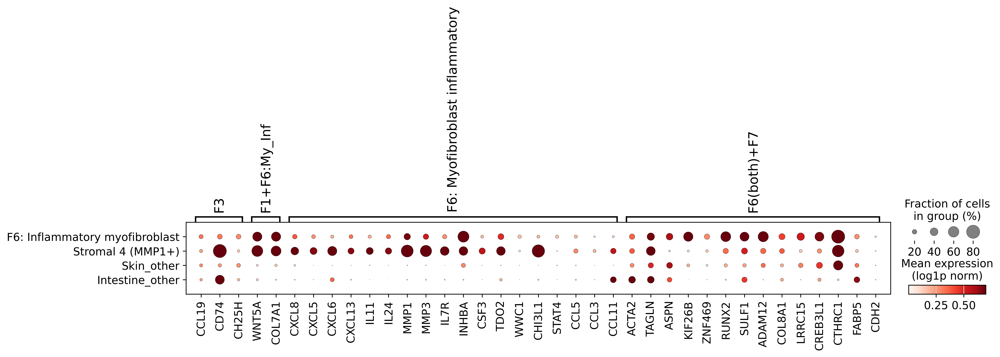

In [15]:
LESIONAL_GENES_VSHORT5 = {'F3': ['CCL19', 'CD74', 'CH25H'],
 'F1+F6:My_Inf': ['WNT5A', 'COL7A1'],
 'F6: Myofibroblast inflammatory': ['CXCL8',
  'CXCL5',
  'CXCL6',
  'CXCL13',
  'IL11',
  'IL24',
  'MMP1',
  'MMP3',
  'IL7R',
  'INHBA',
  'CSF3',
  'TDO2',
  'WWC1',
  'CHI3L1',
  'STAT4',
  'CCL5',
  'CCL3',
  'CCL11'],
                          'F6(both)+F7': ['ACTA2',
  'TAGLN',
  'ASPN',
  'KIF26B',
  'ZNF469',
  'RUNX2',
  'SULF1',
  'ADAM12',
  'COL8A1',
  'LRRC15',
  'CREB3L1',
  'CTHRC1',
 # 'CCN4',
  'FABP5',
  'CDH2'],
                         }

VMAX_VAL=0.7
DOTMAX_VAL=0.8
sc.pl.dotplot(
    adata_ibd,
    LESIONAL_GENES_VSHORT5,
    groupby="test15",
    vmax=VMAX_VAL,
    dot_max=DOTMAX_VAL,
    colorbar_title='Mean expression\n(log1p norm)',
    cmap="Reds",
    categories_order=["F6: Inflammatory myofibroblast", "Stromal 4 (MMP1+)", "Skin_other", "Intestine_other"],
    save="6c.pdf"

)
 

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

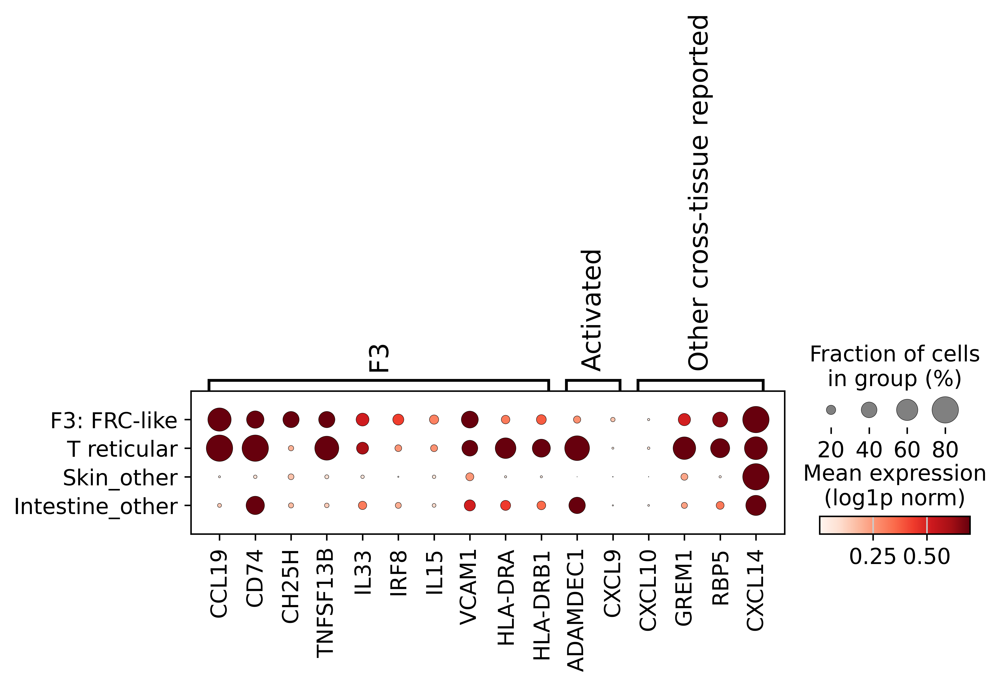

In [17]:
f3_genes = { 'F3': ['CCL19',"CD74" ,  'CH25H',  "TNFSF13B",  'IL33', "IRF8" ,#"COX4I2", 
       # "IL7",
        "IL15",
        "VCAM1", "HLA-DRA", "HLA-DRB1",# "CCL11","CCL7", "CCL2",
        
        #"ICAM1", 
        #'CX3CL1', 'ACHE', 'CCL8', 
 
           ], "Activated": ["ADAMDEC1", "CXCL9", #"CXCL10"
                           ],
            "Other cross-tissue reported": ['CXCL10', 'GREM1', 'RBP5', 'CXCL14',]
           }


sc.pl.dotplot(
    adata_ibd,
    f3_genes,
    groupby="test16",
    #standard_scale="var",
    vmax=VMAX_VAL,
    dot_max=DOTMAX_VAL,
    colorbar_title='Mean expression\n(log1p norm)',
    cmap="Reds",
    categories_order=['F3: FRC-like', 'T reticular', "Skin_other", "Intestine_other"],
    save="6d.pdf"
)
 

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


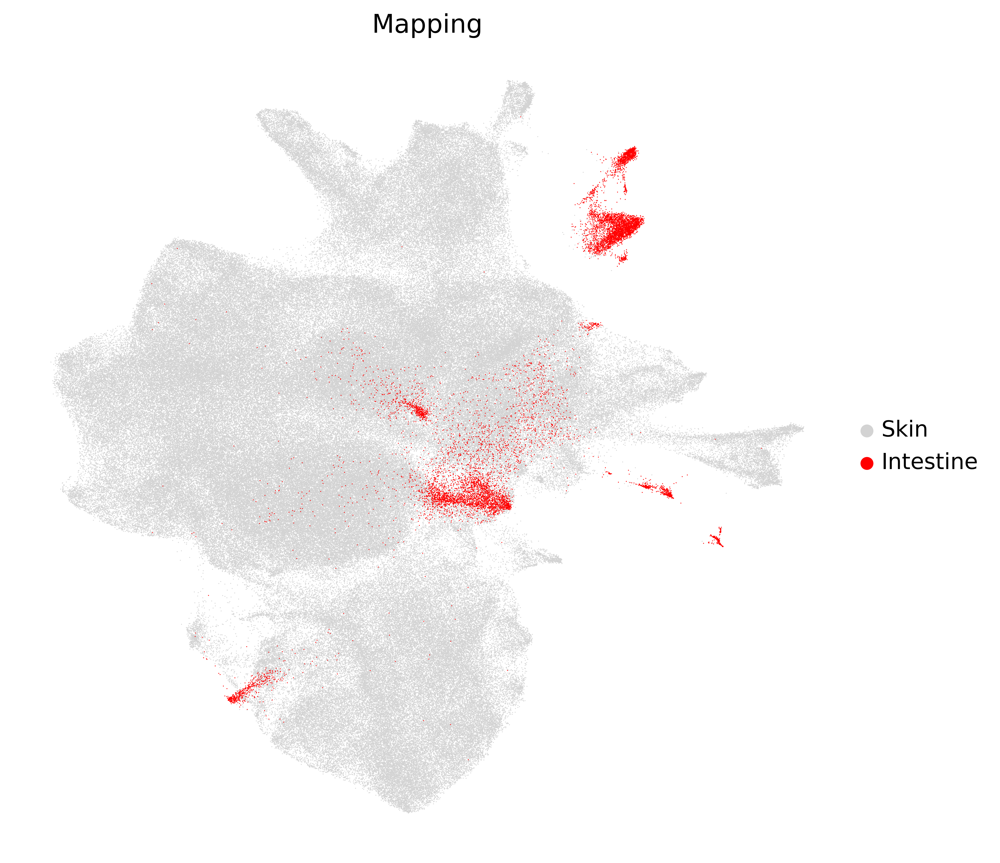

In [22]:

sc.pl.umap(
    adata_ibd,
    color="Mapping",
    #legend_loc="on data",
    vmax=0.8,
    s=1,
    legend_fontsize=12,
    save="6b.pdf"
)